<a href="https://colab.research.google.com/github/nmoisseeva/lahaina/blob/main/hydraulic_jump.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#January 30, 2025
#analysis of jump location from Lahaina fire

In [3]:
!pip install Cartopy
!pip install netCDF4

In [4]:
import shapefile
from scipy.spatial import cKDTree
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from shapely.geometry.polygon import Polygon
from shapely.geometry import Point
import netCDF4 as nc

import cartopy.crs as crs
from cartopy.feature import NaturalEarthFeature

# from wrf import (getvar, interplevel, to_np, latlon_coords, get_cartopy,
#                  cartopy_xlim, cartopy_ylim)
import os

In [189]:
#### INPUTS ####

#set paths

wrfrst_path = '/content/drive/MyDrive/data/lahaina/u10/wrfrst_d03_2023-08-09:15_'

fig_path = '/content/drive/MyDrive/colab/lahaina/figs/'
shp_file = '/content/drive/MyDrive/data/lahaina/fire_perimeters/fsri_perim_extr.shp'

#ignition start time from beginning of run in seconds
rst_tags = ['18Z07','00Z08','06Z08','12Z08','18Z08']


In [41]:
#plotting stuff
import matplotlib as mpl
from matplotlib import rc
rc('text', usetex=False)
# mpl.rcParams['text.latex.preamble'] = [r'\usepackage{amsmath}']
mpl.rcParams['figure.dpi'] = 200

#set up google tiles - CHECK THIS IS OK TO USE!
from cartopy.io.img_tiles import GoogleTiles
import cartopy.crs as ccrs

class ShadedReliefESRI(GoogleTiles):
    # shaded relief
    def _image_url(self, tile):
        x, y, z = tile
        # url = ('https://server.arcgisonline.com/ArcGIS/rest/services/' \
        #        'World_Shaded_Relief/MapServer/tile/{z}/{y}/{x}.jpg').format(
        #        z=z, y=y, x=x)
        url = ('https://server.arcgisonline.com/ArcGIS/rest/services/' \
               'World_Imagery/MapServer/tile/{z}/{y}/{x}.jpg').format(
               z=z, y=y, x=x)
        return url

In [186]:
#create custom transparency cmap
from matplotlib.colors import ListedColormap

# Choose colormap
cmap = plt.cm.YlOrBr
# Get the colormap colors
alpha_cmap = cmap(np.arange(cmap.N))
# Set alpha
alpha_cmap[:,-1] = np.linspace(0.3, 0.7, 76).tolist() + (np.ones(180)*0.7).tolist()
# Create new colormap
alpha_cmap = ListedColormap(alpha_cmap)

In [7]:
#load fire perimeters
perim = shapefile.Reader(shp_file).shapeRecord(0)
coords = perim.shape.__geo_interface__['coordinates']
polygons = []
for poly in coords:
  polygons.append(Polygon(np.squeeze(poly)))

...opening: 18Z07
...opening: 00Z08
...opening: 06Z08
...opening: 12Z08
...opening: 18Z08


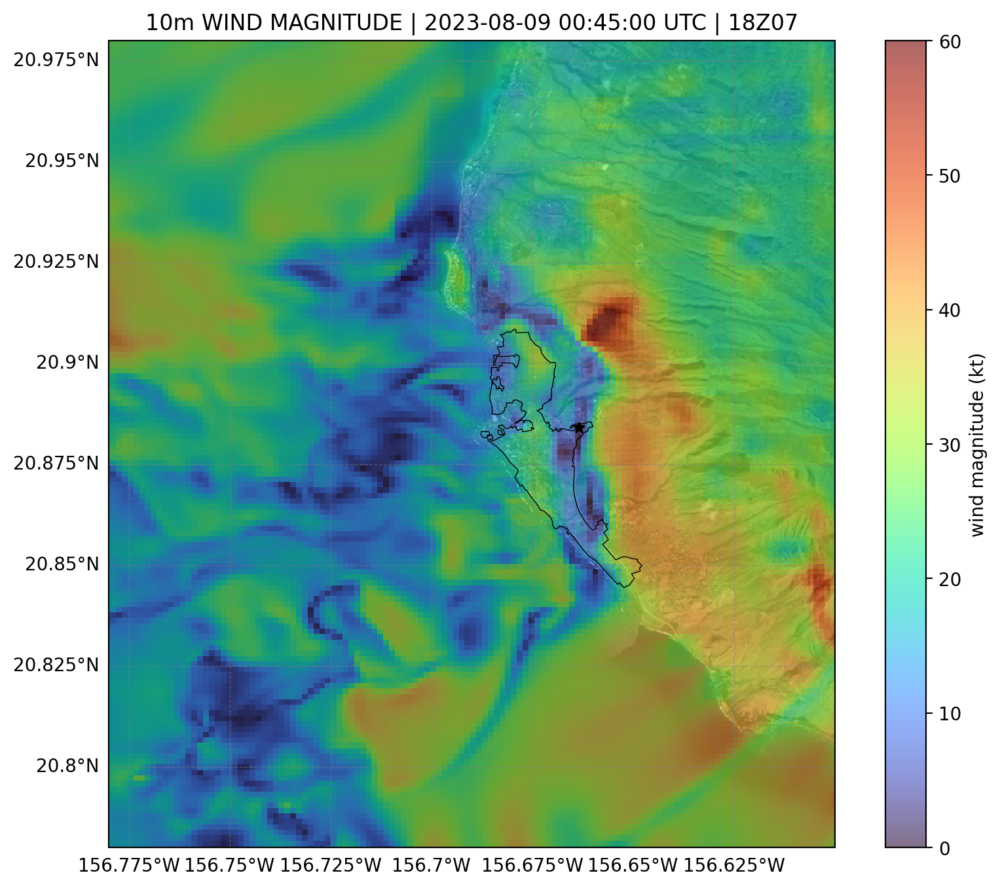

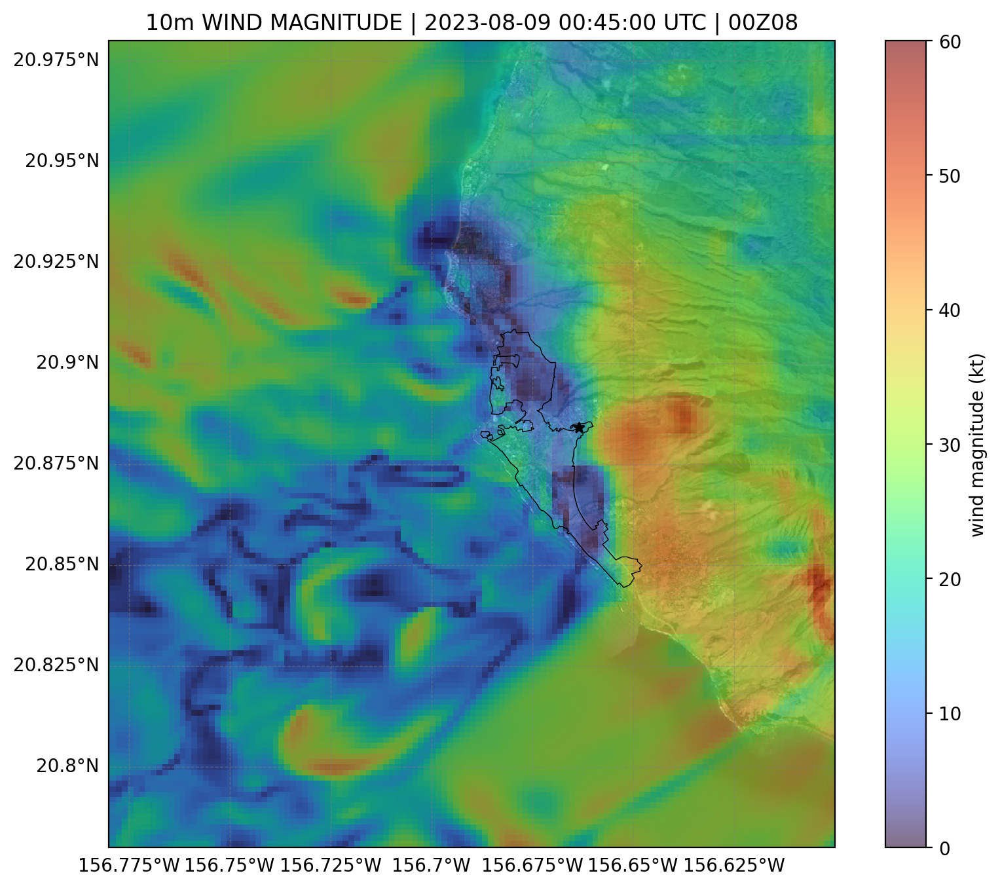

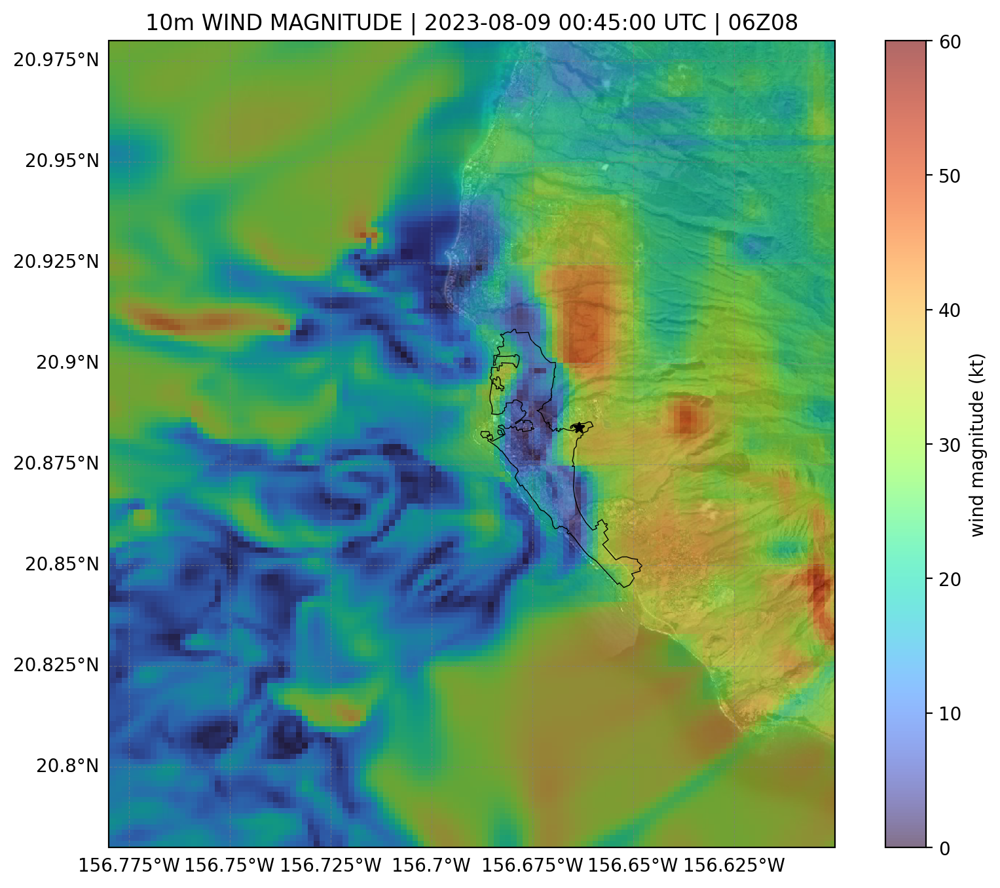

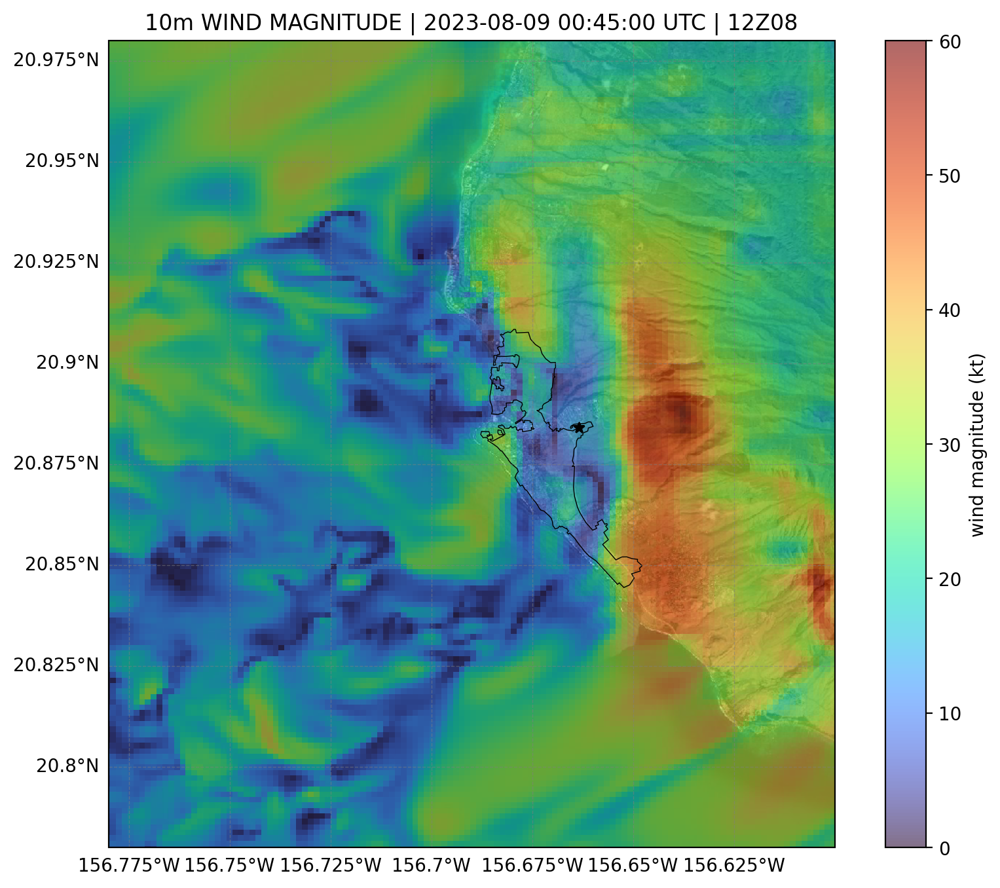

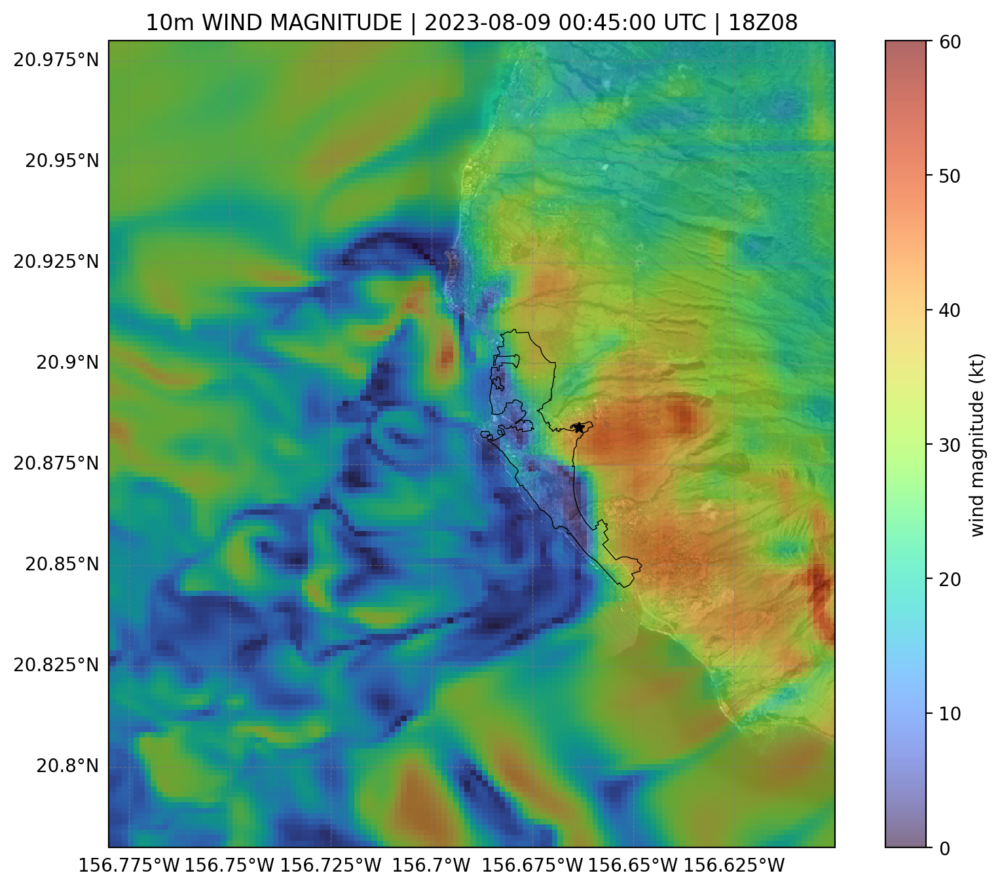

In [190]:
#load the files and plout surface wind magnitude
u10_array = []
xtime_array = []

for iRun, run in enumerate(rst_tags):

  #open file
  print(f'...opening: {run}')
  wrfrst_file = wrfrst_path + run
  wrfrst = nc.Dataset(wrfrst_file, 'r')

  #get wind vars and magnitude
  xlat = wrfrst.variables['XLAT'][-1]
  xlong = wrfrst.variables['XLONG'][-1]
  xtime = pd.to_datetime(wrfrst.variables['XTIME'].units[-19:]) + pd.Timedelta(float(wrfrst.variables['XTIME'][-1]), unit='minutes')

  #files created with nco have an extra dimension
  u10 = wrfrst.variables['U10'][-1,-1,:,:]
  v10 = wrfrst.variables['V10'][-1,-1,:,:]
  U = (u10**2 + v10**2)**(0.5) * 1.94384  #converting to kt


  u10_array.append(U)
  xtime_array.append(xtime)


  # Create a figure
  fig = plt.figure(figsize=(10,8))

  # Set the GeoAxes to the projection used by WRF
  # ax = plt.axes(projection=ShadedReliefESRI().crs)
  ax = plt.axes(projection=crs.PlateCarree())
  ax.set_extent([-156.78,-156.6, 20.78, 20.98])
  ax.add_image(ShadedReliefESRI(), 13)

  # plt.pcolormesh(xlong, xlat, U, cmap='turbo', transform=ShadedReliefESRI().crs,vmin = 0, vmax = 80, alpha=0.8)

  plt.pcolormesh(xlong, xlat, U, cmap='turbo', transform=crs.PlateCarree(),vmin = 0, vmax = 60, alpha=0.6)
  plt.colorbar(label='wind magnitude (kt)')

  ax = plt.gca()
  ax.add_geometries(polygons, crs=crs.PlateCarree(), edgecolor='black', alpha=1, facecolor='none', linewidth=0.5)
  ax.plot(-156.663453,20.884069, marker="*", color="black", transform=crs.PlateCarree())
  plt.title(f'10m WIND MAGNITUDE | {xtime} UTC | {run}')
  gl = ax.gridlines(crs=ccrs.PlateCarree(),draw_labels=True,linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
  gl.top_labels = False
  gl.right_labels = False
  plt.savefig(fig_path + f'hydraulic_jump_{run}_0915.png', dpi=300)

In [161]:
#get some stats
u10_array = np.array(u10_array)
ustd = np.std(u10_array, axis=0)
uvar = np.var(u10_array, axis=0)

In [96]:
# # Compute the spatial derivatives using numpy.gradient
# dU_dx, dU_dy = np.gradient(u10,  xlat[:,0] , xlong[0,:])  # Derivatives of U with respect to x and y
# dV_dx, dV_dy = np.gradient(v10,  xlat[:,0], xlong[0,:])  # Derivatives of V with respect to x and y

# # Calculate the divergence: div(F) = ∂U/∂x + ∂V/∂y
# divergence = dU_dx + dV_dy

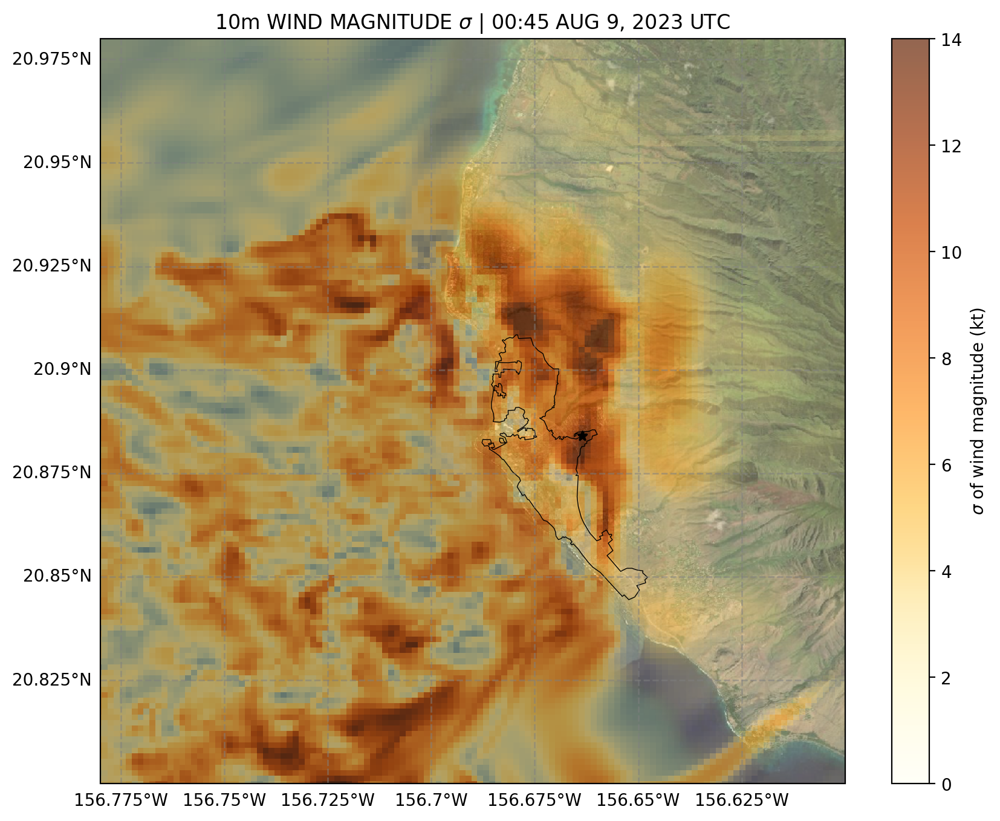

In [188]:

# Create a figure
fig = plt.figure(figsize=(10,8))

# Set the GeoAxes to the projection used by WRF
# ax = plt.axes(projection=ShadedReliefESRI().crs)
ax = plt.axes(projection=crs.PlateCarree())
ax.set_extent([-156.78,-156.6, 20.8, 20.98])
ax.add_image(ShadedReliefESRI(), 13)

# plt.pcolormesh(xlong, xlat, U, cmap='turbo', transform=ShadedReliefESRI().crs,vmin = 0, vmax = 80, alpha=0.8)

plt.pcolormesh(xlong, xlat, ustd, cmap=alpha_cmap, transform=crs.PlateCarree(),vmin = 0, vmax = 14)
plt.colorbar(label=f'$\sigma$ of wind magnitude (kt)')

ax = plt.gca()
ax.add_geometries(polygons, crs=crs.PlateCarree(), edgecolor='black', alpha=1, facecolor='none', linewidth=0.5)
ax.plot(-156.663453,20.884069, marker="*", color="black", transform=crs.PlateCarree())
plt.title(f'10m WIND MAGNITUDE $\sigma$ | 00:45 AUG 9, 2023 UTC')
gl = ax.gridlines(crs=ccrs.PlateCarree(),draw_labels=True,linewidth=1, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
plt.savefig(fig_path + f'hydraulic_jump_std_0915.png', dpi=300)

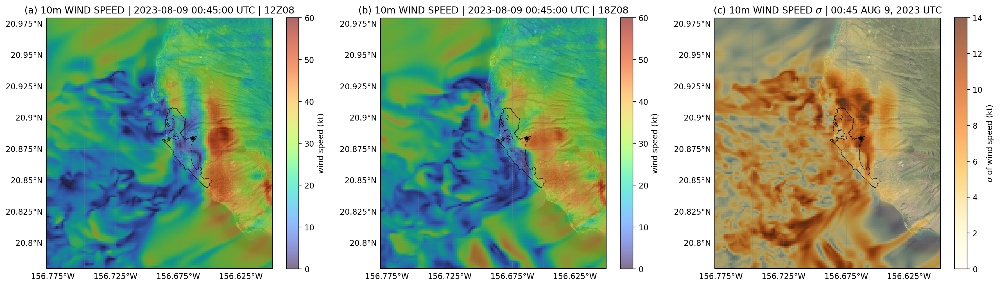

In [202]:
# prompt: create subplot figure 1x3 with u10_array members for 12Z08, 18Z08 and the u10std to match the figuers above

subnum = ['(a)', '(b)', '(c)']
fig, axes = plt.subplots(1, 3, figsize=(18, 5), subplot_kw={'projection': crs.PlateCarree()})

for i, ax in enumerate(axes):
    ax.set_extent([-156.78, -156.6, 20.78, 20.98])
    ax.add_image(ShadedReliefESRI(), 13)

    if i < 2:
        # Plot u10 for 12Z08 and 18Z08
        time_index = rst_tags.index('12Z08') if i == 0 else rst_tags.index('18Z08')
        im = ax.pcolormesh(xlong, xlat, u10_array[time_index], cmap='turbo', vmin=0, vmax=60, alpha=0.6)
        ax.set_title(f'{subnum[i]} 10m WIND SPEED | {xtime_array[time_index]} UTC | {rst_tags[time_index]}')
    else:
        # Plot u10std
        im = ax.pcolormesh(xlong, xlat, ustd, cmap=alpha_cmap, vmin=0, vmax=14)
        ax.set_title(f'{subnum[i]} 10m WIND SPEED $\sigma$ | 00:45 AUG 9, 2023 UTC')

    ax.add_geometries(polygons, crs=crs.PlateCarree(), edgecolor='black', alpha=1, facecolor='none', linewidth=0.5)
    ax.plot(-156.663453, 20.884069, marker="*", color="black", transform=crs.PlateCarree())
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False

    # Add a colorbar to the last subplot
    plt.colorbar(im, ax=ax, label=f'$\sigma$ of wind speed (kt)' if i==2 else 'wind speed (kt)')

plt.tight_layout()
plt.savefig(fig_path + f'hydraulic_jump_subplot_0915.png', dpi=300)
plt.show()
